# **1. Import Libraries, Data Loading & Functions**

## ***1.1. Import essential libraries***

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from scipy.stats import gaussian_kde


## ***1.2. Data Loading***

In [43]:
df = pd.read_csv('/Users/khoi/Documents/FDC/[FDC]/FDC104/Final/bankX (1).csv', index_col=0)
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [44]:
df.rename(columns = {'y':'Target'}, inplace = True)
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


# **2. Exploratory Data Analysis**

<Axes: >

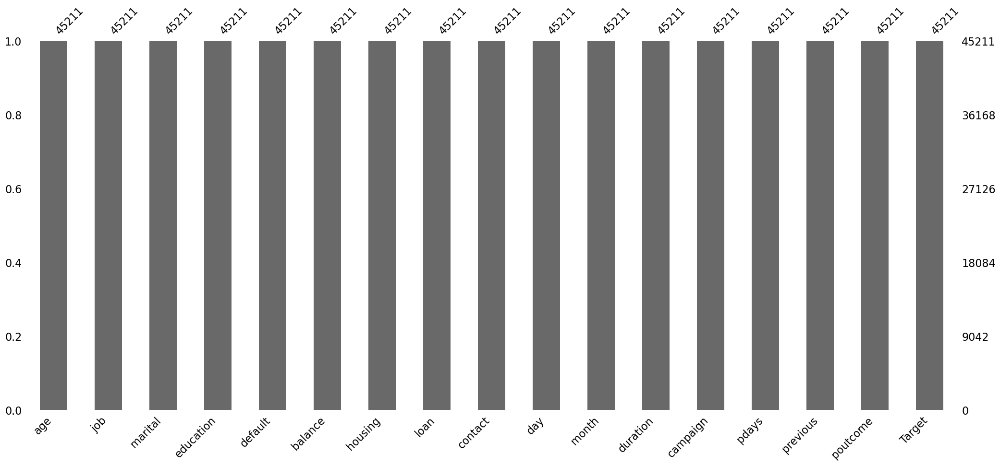

In [45]:
# Check for missing values
msno.bar(df)

In [46]:
for col in df.columns:
    null_count = df[col].isnull().sum(0)
    null_percentage = null_count / len(df)
    print(f'Cột {col} có {null_count} giá trị null, chiếm {null_percentage:,.1f}% dữ liệu')

Cột age có 0 giá trị null, chiếm 0.0% dữ liệu
Cột job có 0 giá trị null, chiếm 0.0% dữ liệu
Cột marital có 0 giá trị null, chiếm 0.0% dữ liệu
Cột education có 0 giá trị null, chiếm 0.0% dữ liệu
Cột default có 0 giá trị null, chiếm 0.0% dữ liệu
Cột balance có 0 giá trị null, chiếm 0.0% dữ liệu
Cột housing có 0 giá trị null, chiếm 0.0% dữ liệu
Cột loan có 0 giá trị null, chiếm 0.0% dữ liệu
Cột contact có 0 giá trị null, chiếm 0.0% dữ liệu
Cột day có 0 giá trị null, chiếm 0.0% dữ liệu
Cột month có 0 giá trị null, chiếm 0.0% dữ liệu
Cột duration có 0 giá trị null, chiếm 0.0% dữ liệu
Cột campaign có 0 giá trị null, chiếm 0.0% dữ liệu
Cột pdays có 0 giá trị null, chiếm 0.0% dữ liệu
Cột previous có 0 giá trị null, chiếm 0.0% dữ liệu
Cột poutcome có 0 giá trị null, chiếm 0.0% dữ liệu
Cột Target có 0 giá trị null, chiếm 0.0% dữ liệu


Nhận xét: Dữ liệu không có giá trị null

In [47]:
df.duplicated().value_counts()

False    45211
Name: count, dtype: int64

In [48]:
#Duplicate Check
duplicate_count = df.duplicated().sum()
print(f'Dữ liệu có {duplicate_count} giá trị trùng lặp')

Dữ liệu có 0 giá trị trùng lặp


## ***3.1. Overview of Dataset***

In [ ]:
#Dataset Overview
print(f'Dataset has {df.shape[0]} rows and {df.shape[1]} columns')
df.info()

Dataset có 45211 dòng và 17 cột
<class 'pandas.core.frame.DataFrame'>
Index: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 6.2+ MB


In [ ]:
#Classifying Numerical and Categorical Columns
cat_col = df.select_dtypes(include = 'object').columns.to_list()
cat_col = [col for col in cat_col if col != 'Target']
num_col = df.select_dtypes(exclude = 'object').columns.to_list()
num_col = [col for col in num_col if col != 'Targer']
target_col = df['Target']

print(f'Categorical columns are {cat_col}')
print(f'Numerical columns are {num_col}')

Categorical columns are ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']
Numerical columns are ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']


## ***3.2. Univariate Analysis***

### 3.2.0 Target column

In [51]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [52]:
#Target achievemnt check
target_count = df['Target'].value_counts().reset_index()
target_count.columns = ['Target', 'Count']

fig = px.bar(
    target_count,
    x = 'Target',
    y = 'Count',
    color = 'Target',
    text_auto= True,
    template='plotly_white',
)
fig.update_yaxes(showgrid = True)
fig.update_xaxes(showgrid = False)
fig.show()


## 3.2.1. Categorical columns

In [53]:
n_cols = 3 
n_rows = (len(cat_col) + n_cols - 1) // n_cols

fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=cat_col)

for i, cols in enumerate(cat_col):
    value_counts = df[col].value_counts()
    x_vals = value_counts.index.tolist()
    y_vals = value_counts.values.tolist()
    annotations = [f'{v}' for v in y_vals]
    
    row = i // n_cols + 1
    col_pos = i % n_cols + 1
    
    fig.add_trace(
        go.Bar(
            x = x_vals,
            y = y_vals,
            text=annotations,
            textposition='auto',
            name=col
        ),
        row=row, col=col_pos
    )
fig.update_layout(
    height=350*n_rows,
    width=1500,
    title_text='Categorical variables',
    showlegend=False,
    template='plotly_white'
)
fig.update_yaxes(showgrid=True)
fig.update_xaxes(showgrid=False)
fig.show()
    
    

## 3.2.2. Numerical columns

In [54]:
# fig/ax setup
n_cols = 3
n_rows = (len(num_col) + n_cols - 1) // n_cols

# Create subplot
fig = make_subplots(
    rows=n_rows, 
    cols=n_cols, 
    subplot_titles=num_col,
    horizontal_spacing=0.08,
    vertical_spacing=0.1
)

for i, col in enumerate(num_col):
    row = i //n_cols + 1
    col_pos = i % n_cols + 1
    data = df[col].dropna()
    mean_val = data.mean()
    
    counts, bins = np.histogram(data, bins = 30)
    ymax = counts.max()
    
    fig.add_trace(
        go.Histogram(
            x=data,
            name=col,
            marker_color='lightblue',
            opacity=0.6,
            nbinsx=30,
            showlegend=False
        ),
        row=row, col=col_pos
    )

    fig.add_trace(
        go.Scatter(
            x=[mean_val,mean_val],
            y=[0, ymax],
            mode='lines',
            line=dict(color='grey', dash='dash'),
            name = f'Mean: {round(mean_val, 2)}',
            showlegend=False
        ),
        row=row, col=col_pos
    )
    kde = gaussian_kde(data)
    x_kde = np.linspace(data.min(), data.max(), 200)
    y_kde = kde(x_kde) * len(data) * (bins[1] - bins[0])
    
    fig.add_trace(
        go.Scatter(
            x = x_kde,
            y = y_kde,
            mode = 'lines',
            line = dict(color='lightblue', width = 1.5),
            name = 'KDE',
            showlegend = False
        ),
        row=row, col=col_pos
    )

fig.update_layout(
    height = 350 * n_rows,
    width = 1500,
    title_text = 'Distribution of numerical variables',
    template = 'plotly_white',
    showlegend = False
)

fig.update_xaxes(showgrid = True)
fig.update_yaxes(showgrid = False)

fig.show()
    
    


In [55]:
#Noisy data check
df[['pdays', 'campaign', 'previous']].describe().T

,count,mean,std,min,25%,50%,75%,max
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


## ***3.3. Bivariate Analysis***

### *3.3.1. Analysis of demographic attributes* 

In [56]:
fig=px.box(df, 
           x='marital', y='age',
           color='marital', template='simple_white',
           title='<b>Age distribution by marital status')
fig.update_layout(title_x=0.5, legend_title='Marital status')
fig.show()

In [57]:
fig=px.box(df, x='job', y='age', color='job', template='plotly_white',
           title='<b>Age dsitribution by occupation'
)
fig.update_layout(title_x=0.5, legend_title='Occupation')
fig.show()

In [58]:
fig=px.box(df, x='education', y='age', color='education', template='plotly_white',
           title='<b> Age distribution by education'
)
fig.update_layout(title_x=0.5, legend_title='Education')
fig.show()

### *3.3.2. Analysis of financial status*

In [59]:
a=df.groupby(['job'], as_index=False)['balance'].mean()
a['balance']=round(a['balance'], 2)

fig=px.bar(a.sort_values(by='balance', ascending=False), 
           x='job', y='balance', text='balance', color='job', template='plotly_white')
fig.update_traces(marker=dict(line=dict(color='#000000', width=1.2)))
fig.update_layout(title_x=0.5, title_text='<b>Account balance by occupation', legend_title='Occupation')

fig.show()

In [60]:
b=df.groupby(['marital'], as_index=False)['balance'].mean()
b['balance']=round(a['balance'], 2)
fig=px.bar(b.sort_values(by='balance', ascending=False), x='marital', y='balance', text='balance', color='marital', template='plotly_white')
fig.update_layout(title_x=0.5, title_text='<b> Account balance by marital status', legend_title_text='marital status')
fig.update_traces(marker=dict(line=dict(color='#000000', width=1.2)))
fig.show()

### *3.3.3. Analysis of customer loan status*

In [61]:
cols = ['default', 'housing', 'loan']
titles = ['Vỡ nợ', 'Vay mua nhà', 'Vay cá nhân']
colors = ['Crimson', 'ForestGreen']

# Subplots setup
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{"type": "pie"}] * 3],
    subplot_titles=titles
)

for i, col in enumerate(cols):
    vc = df[col].value_counts().reset_index()
    vc.columns = [col.capitalize(), 'Count']
    
    fig.add_trace(
        go.Pie(
            values=vc['Count'],
            labels=vc[col.capitalize()],
            hole=0.7,
            marker_colors=colors,
            name=titles[i],
            showlegend=(i == 2)
        ),
        row=1, col=i + 1
    )

# Layout config
fig.update_layout(
    title_text='<b>Credit and Loan Analysis</b>',
    title_x=0.5,
    template='plotly_white',
    showlegend=True,
    legend_title_text=" ",
)
fig.update_traces(marker=dict(line=dict(color='#000000', width=1)))

fig.show()


In [62]:
fig=px.line(df.groupby(['age','loan'],as_index=False)['job'].count().rename(columns={'job':'Count'}),x='age',y='Count',color='loan',template='plotly_white',color_discrete_sequence=['DarkRed','ForestGreen'])
fig.update_layout(title_x=0.5,legend_title_text="<b>Vay cá nhân",title_text='<b>Are personal loans influenced by age?')
fig.show()

In [63]:
fig=px.line(df.groupby(['age', 'housing'],as_index=False)['job'].count().rename(columns={'job':'Count'}),
            x='age',y='Count',
            color='housing',
            template='plotly_white',
            color_discrete_sequence=['DarkRed', 'ForestGreen'])
fig.update_layout(title_x=0.5, legend_title_text="<b>Housing loan", title_text="<b>Do younger people take out more housing loans?")
fig.show()


In [64]:
a = df.groupby(['poutcome', 'Target'], as_index=False)['age'].count().rename(columns={'age':'Count'})
a['percent'] = round(a['Count'] * 100/ a.groupby('poutcome')['Count'].transform('sum'), 1)
a['percentile'] = a['percent'].apply(lambda x: f'{x}%')

fig = px.bar(
    a,
    x='poutcome',
    y='percent',
    color='Target',
    text='percentile',
    template='simple_white',
    barmode='group',
    color_discrete_sequence=['Crimson', 'ForestGreen']
)

fig.update_layout(
    title_text='<b>Previous campaign outcome vs Target achievement</b>',
    title_x=0.5,
    legend_title_text='Target',
    xaxis_title='Previous campaign outcome',
    yaxis_title='Count'
)

fig.update_traces(marker=dict(line=dict(color='#000000', width=1.2)), textposition='outside')


# **4. Applying Machine Learning models for predictve analysis**  

## ***4.1. Import additional libraries and reload original data***

In [65]:
#sklearn packages
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, LabelEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_selection import SelectKBest, chi2, RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import xgboost as xgb
import timeit

pd.set_option('display.max_columns', None)

In [66]:
df = pd.read_csv('/Users/khoi/Documents/FDC/[FDC]/FDC104/Final/bankX (1).csv', index_col=0)
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


## ***4.2. Data preprocessing & feature engineering*** 

## *4.2.1 Feature engineering*

In [67]:
cat_features = df.select_dtypes(include=['object', 'bool']).columns.values
print(f'Categorical features: {cat_features}')

Categorical features: ['job' 'marital' 'education' 'default' 'housing' 'loan' 'contact' 'month'
 'poutcome' 'y']


In [68]:
df_encoded = pd.get_dummies(df, columns=['job','marital','contact','default','housing','loan'])

In [69]:
label_encoder = LabelEncoder()
df_encoded['y'] =  label_encoder.fit_transform(df_encoded['y'])
df_encoded['month'] = label_encoder.fit_transform(df_encoded['month'])
df_encoded['education'] = label_encoder.fit_transform(df_encoded['education'])

In [70]:
df_encoded = df_encoded.drop(columns=['poutcome'])
df_encoded

,age,education,balance,day,month,duration,campaign,pdays,previous,y,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes,housing_no,housing_yes,loan_no,loan_yes
0,58,2,2143,5,8,261,1,-1,0,0,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,True,False,False,True,True,False
1,44,1,29,5,8,151,1,-1,0,0,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,True,True,False,False,True,True,False
2,33,1,2,5,8,76,1,-1,0,0,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,True,False,False,True,False,True
3,47,3,1506,5,8,92,1,-1,0,0,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,True,False,False,True,True,False
4,33,3,1,5,8,198,1,-1,0,0,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,True,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,2,825,17,9,977,3,-1,0,1,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,True,False,False,True,False,True,False,True,False
45207,71,0,1729,17,9,456,2,-1,0,1,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,False,True,False,True,False,True,False
45208,72,1,5715,17,9,1127,5,184,3,1,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,True,False,False,True,False,True,False,True,False
45209,57,1,668,17,9,508,4,-1,0,0,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,True,False,True,False,True,False


In [71]:
unknown_columns = ['job_unknown', 'contact_unknown']
df_encoded.drop(columns=unknown_columns, axis=1, inplace=True)
df_encoded.head()

,age,education,balance,day,month,duration,campaign,pdays,previous,y,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_divorced,marital_married,marital_single,contact_cellular,contact_telephone,default_no,default_yes,housing_no,housing_yes,loan_no,loan_yes
0,58,2,2143,5,8,261,1,-1,0,0,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,True,False
1,44,1,29,5,8,151,1,-1,0,0,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,True,False
2,33,1,2,5,8,76,1,-1,0,0,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,True
3,47,3,1506,5,8,92,1,-1,0,0,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,True,False
4,33,3,1,5,8,198,1,-1,0,0,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,True,False,True,False


In [72]:
#Train-test split
X = df_encoded.drop(columns=['y'])
y = df_encoded['y']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=36)

In [73]:
#Calculate the count of 'yes' and 'no' in the 'y' column
yes_count = (df['y'] == 'yes').sum()
no_count = (df['y'] == 'no').sum()
total_count = len(df)

percentage_yes = yes_count / total_count * 100
percentage_no = no_count / total_count * 100

print('Bfore sampling')
print("Percentage of 'yes' in 'y':", percentage_yes)
print("Percentage of 'no' in 'y':", percentage_no)

Bfore sampling
Percentage of 'yes' in 'y': 11.698480458295547
Percentage of 'no' in 'y': 88.30151954170445


In [74]:
#Use SMOTE to oversample the minority class in the training data because the number of 'yes' is much smaller than 'no' in the target variable, which can lead to imbalanced data and affect the performance of machine learning models. SMOTE helps to balance the dataset by generating synthetic samples for the minority class, improving the model's ability to learn from both classes effectively.

from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=36)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [75]:
resampled_data = pd.concat([X_resampled, y_resampled], axis = 1)
resampled_data

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_divorced,marital_married,marital_single,contact_cellular,contact_telephone,default_no,default_yes,housing_no,housing_yes,loan_no,loan_yes,y
0,58,2,2143,5,8,261,1,-1,0,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,True,False,0
1,44,1,29,5,8,151,1,-1,0,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,True,False,0
2,33,1,2,5,8,76,1,-1,0,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,True,0
3,47,3,1506,5,8,92,1,-1,0,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,True,False,0
4,33,3,1,5,8,198,1,-1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,True,False,True,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79839,41,0,5317,17,9,986,1,3,0,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,True,False,1
79840,44,1,93,10,7,279,2,186,8,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,True,False,True,False,True,False,1
79841,40,1,1524,19,0,565,1,-1,0,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,True,False,True,False,True,False,1
79842,55,0,3517,23,1,627,2,-1,0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,True,False,1


In [76]:
labelencodey = LabelEncoder()
resampled_data['y'] = labelencodey.fit_transform(resampled_data['y'])


In [77]:
yes_count = (resampled_data['y'] == 1).sum()
no_count = (resampled_data['y'] == 0).sum()
total_count = len(resampled_data)

percentage_yes = yes_count / total_count * 100
percentage_no = no_count / total_count * 100

print('After SMOTE sampling')
print("Percentage 'yes' in 'y':", percentage_yes)
print("Percentage 'no' in 'y':", percentage_no)

After SMOTE sampling
Percentage 'yes' in 'y': 50.0
Percentage 'no' in 'y': 50.0


In [78]:
X_resampled = resampled_data.drop(columns=['y'], axis = 1)
y_resampled = resampled_data['y']

#Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=36)

In [79]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## ***4.3 Building and evaluating machine learning models***


### *4.3.1 Logistic Regression*

In [80]:
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

LogisticRegression()

Accuracy: 0.9220364456133759

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.89      0.96      0.93      8033
           1       0.96      0.88      0.92      7936

    accuracy                           0.92     15969
   macro avg       0.93      0.92      0.92     15969
weighted avg       0.92      0.92      0.92     15969


Confusion Matrix for Test Set:
[[7743  290]
 [ 955 6981]]


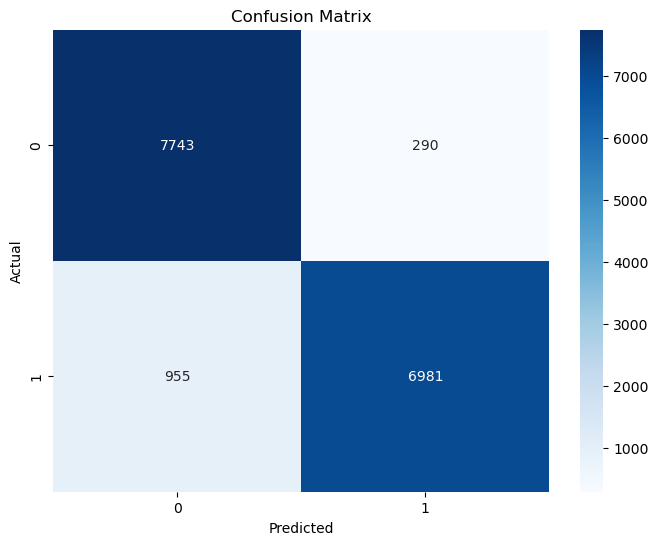

In [81]:
#Predict probabilities for the test set
y_pred = model.predict(X_test_scaled)

#Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

#Test set classification report 
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix for Test Set:")
print(confusion_matrix(y_test, y_pred))
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()    

### *4.3.2. Random Forest Classifier*

In [82]:
rfc = RandomForestClassifier(n_estimators=100, random_state=36)

# Train the model
rfc.fit(X_train_scaled, y_train)

RandomForestClassifier(random_state=36)

In [83]:
y_pred = rfc.predict(X_test_scaled)


Test Accuracy: 0.9475859477738118

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      8033
           1       0.96      0.94      0.95      7936

    accuracy                           0.95     15969
   macro avg       0.95      0.95      0.95     15969
weighted avg       0.95      0.95      0.95     15969


Confusion Matrix for Test Set:
[[7698  335]
 [ 502 7434]]


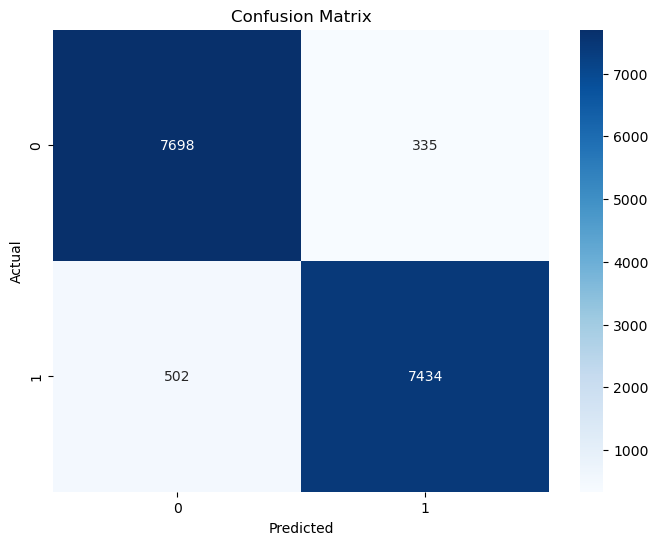

In [84]:
test_accuracy = accuracy_score(y_test, y_pred)
print("\nTest Accuracy:", test_accuracy)

# Generate a classification report for the test set
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_pred))

# Generate a confusion matrix for the test set
print("\nConfusion Matrix for Test Set:")
print(confusion_matrix(y_test, y_pred))
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [85]:
feature_importance = rfc.feature_importances_
# You can associate these scores with feature names for better understanding
feature_names = X_train.columns
feature_importance_dict = dict(zip(feature_names, feature_importance))

# Sort features by importance (descending order)
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)
for feature, importance in sorted_feature_importance:
    print(f"{feature}: {importance:.4f}")

duration: 0.2422
housing_yes: 0.0996
month: 0.0528
balance: 0.0502
marital_married: 0.0464
housing_no: 0.0440
age: 0.0431
pdays: 0.0423
day: 0.0421
job_blue-collar: 0.0391
marital_single: 0.0329
loan_yes: 0.0291
campaign: 0.0278
marital_divorced: 0.0264
job_technician: 0.0262
previous: 0.0222
job_management: 0.0188
job_services: 0.0182
job_admin.: 0.0170
education: 0.0166
loan_no: 0.0135
contact_cellular: 0.0084
job_housemaid: 0.0065
job_retired: 0.0064
job_unemployed: 0.0063
job_self-employed: 0.0062
job_entrepreneur: 0.0056
contact_telephone: 0.0053
job_student: 0.0029
default_no: 0.0010
default_yes: 0.0006


### *4.3.3. Decision Tree*

In [86]:
### *4.3.2. Random Forest Classifier*
dtc = DecisionTreeClassifier(random_state=36)

dtc.fit(X_train_scaled, y_train)

DecisionTreeClassifier(random_state=36)

In [87]:
y_pred = dtc.predict(X_test_scaled)

Training Accuracy: 1.0

Test Accuracy: 0.9098252864925793

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      8033
           1       0.90      0.92      0.91      7936

    accuracy                           0.91     15969
   macro avg       0.91      0.91      0.91     15969
weighted avg       0.91      0.91      0.91     15969


Confusion Matrix for Test Set:
[[7214  819]
 [ 621 7315]]


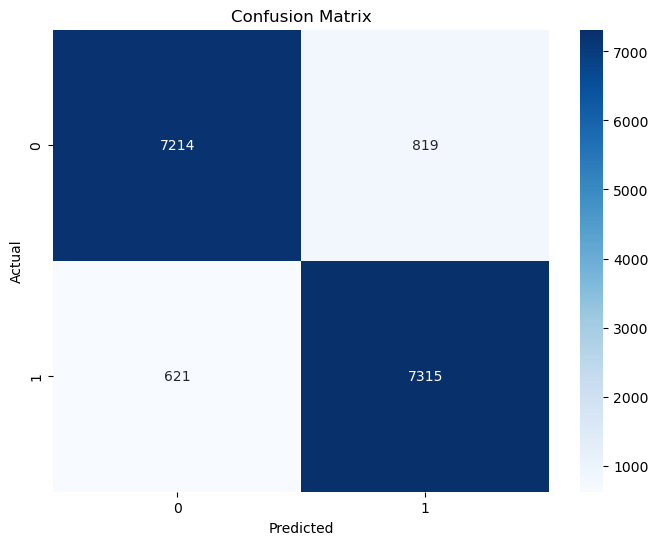

In [88]:
# Make predictions on the training data
y_train_pred = dtc.predict(X_train_scaled)

# Calculate and print accuracy for the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Training Accuracy:", train_accuracy)

# Make predictions on the test data
y_test_pred = dtc.predict(X_test_scaled)

# Calculate and print accuracy for the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print("\nTest Accuracy:", test_accuracy)

# Generate a classification report for the test set
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

# Generate a confusion matrix for the test set
print("\nConfusion Matrix for Test Set:")
print(confusion_matrix(y_test, y_test_pred))

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### *4.3.4. XGBoost Classifier*

In [89]:
xgbc = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the model on the training data
xgbc.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

Training Accuracy: 0.9671232876712329

Test Accuracy: 0.9435781827290375

Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      8033
           1       0.95      0.94      0.94      7936

    accuracy                           0.94     15969
   macro avg       0.94      0.94      0.94     15969
weighted avg       0.94      0.94      0.94     15969


Confusion Matrix for Test Set:
[[7637  396]
 [ 505 7431]]


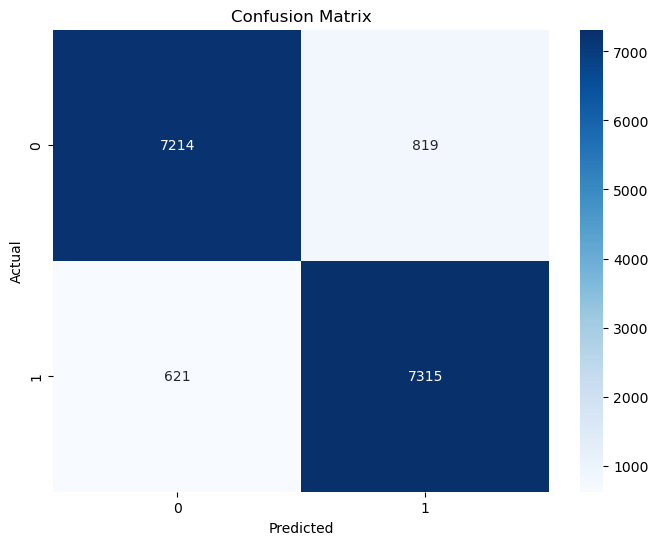

In [90]:
# Make predictions on the training data
y_train_pred = xgbc.predict(X_train_scaled)

# Calculate and print accuracy for the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print("Training Accuracy:", train_accuracy)

# Make predictions on the test data
y_test_pred = xgbc.predict(X_test_scaled)

# Calculate and print accuracy for the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print("\nTest Accuracy:", test_accuracy)

# Generate a classification report for the test set
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_test_pred))

# Generate a confusion matrix for the test set
print("\nConfusion Matrix for Test Set:")
print(confusion_matrix(y_test, y_test_pred))

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [91]:

# Model comparison
models = ['Logistic Regression', 'Random Forest', 'Decision Tree', 'XGBoost']
accuracies = [
    accuracy_score(y_test, model.predict(X_test_scaled)),
    accuracy_score(y_test, rfc.predict(X_test_scaled)),
    accuracy_score(y_test, dtc.predict(X_test_scaled)),
    accuracy_score(y_test, xgbc.predict(X_test_scaled))
]

comparison_df = pd.DataFrame({'Model': models, 'Accuracy': accuracies})
comparison_df.sort_values(by='Accuracy', ascending=False)


,Model,Accuracy
1,Random Forest,0.947586
3,XGBoost,0.943578
0,Logistic Regression,0.922036
2,Decision Tree,0.909825


##  Summary

- **Data**: Bank marketing dataset with client details and response to a term deposit offer.
- **EDA**: Identified distribution patterns and variable importance.
- **Preprocessing**: Label encoding, one-hot encoding, SMOTE for imbalance, scaling.
- **Models Built**:
  - Logistic Regression
  - Random Forest
  - Decision Tree
  - XGBoost

=> Random Forest provides the highest accuracy among the models used

*Detailed Analysis can be found in the attached Report PDF file